# **Part 1 ( Spoof Detection ) 25%**

In [3]:
import io
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import transforms
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from PIL import Image
import numpy as np
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from transformers import TrainingArguments, Trainer
from transformers import ViTFeatureExtractor, ViTForImageClassification, Trainer, TrainingArguments

In [2]:
pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 487.4/487.4 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 15.0 MB/s eta 0:00:00


In [15]:
from datasets import load_dataset
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from transformers import ViTFeatureExtractor

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Dataset Preparation: Load a dataset containing real and spoofed images.

In [6]:
dataset = load_dataset("nguyenkhoa/celeba-spoof-for-face-antispoofing-test")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/437 [00:00<?, ?B/s]

test-00000-of-00010.parquet:   0%|          | 0.00/496M [00:00<?, ?B/s]

test-00001-of-00010.parquet:   0%|          | 0.00/493M [00:00<?, ?B/s]

test-00002-of-00010.parquet:   0%|          | 0.00/494M [00:00<?, ?B/s]

test-00003-of-00010.parquet:   0%|          | 0.00/487M [00:00<?, ?B/s]

test-00004-of-00010.parquet:   0%|          | 0.00/495M [00:00<?, ?B/s]

test-00005-of-00010.parquet:   0%|          | 0.00/499M [00:00<?, ?B/s]

test-00006-of-00010.parquet:   0%|          | 0.00/500M [00:00<?, ?B/s]

test-00007-of-00010.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

test-00008-of-00010.parquet:   0%|          | 0.00/487M [00:00<?, ?B/s]

test-00009-of-00010.parquet:   0%|          | 0.00/495M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/67170 [00:00<?, ? examples/s]

In [6]:
print(dataset)

DatasetDict({
    test: Dataset({
        features: ['cropped_image', 'labels', 'labelNames'],
        num_rows: 67170
    })
})


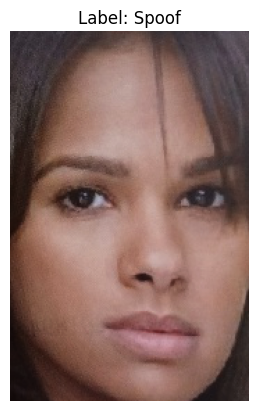

In [ ]:
sample = dataset["test"][0]
image = sample["cropped_image"]
label = sample["labels"]

plt.imshow(image)
if label == 0:
    plt.title("Label: Real")
else:
    plt.title("Label: Spoof")
plt.axis("off")
plt.show()

In [7]:
subset_size = int(0.2 * len(dataset['test']))
dataset_subset = dataset['test'].shuffle(seed=42).select(range(subset_size))

train_size = int(0.75 * len(dataset_subset))
test_size = len(dataset_subset) - train_size

train_dataset, test_dataset = random_split(dataset_subset, [train_size, test_size])

### Model Training: Fine-tune a ViT model for binary classification (Real vs. Spoof).

In [8]:
# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

In [16]:
# Load Feature Extractor
feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224-in21k", do_rescale=False)

class CustomDataset(Dataset):
    def __init__(self, dataset, feature_extractor):
        self.dataset = dataset
        self.feature_extractor = feature_extractor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        example = self.dataset[idx]

        # 🔹 Print available keys in the dataset to debug
        if idx == 0:  # Print only for the first batch
            print(f"Available keys in dataset: {example.keys()}")

        # 🔹 Check if "cropped_image" key exists
        if "cropped_image" not in example:
            raise KeyError(f"Key 'cropped_image' not found! Available keys: {example.keys()}")

        image = example["cropped_image"]

        # Convert image format if necessary
        if isinstance(image, bytes):
            image = Image.open(io.BytesIO(image)).convert("RGB")
        elif isinstance(image, np.ndarray):
            image = Image.fromarray(image).convert("RGB")
        elif not isinstance(image, Image.Image):
            raise ValueError(f"Unexpected image format at index {idx}: {type(image)}")

        # Apply transformations
        image = transform(image)

        # Extract features using Hugging Face feature extractor
        inputs = self.feature_extractor(images=image, return_tensors="pt")
        inputs = {key: val.squeeze(0) for key, val in inputs.items()}
        inputs["labels"] = torch.tensor(example["labels"], dtype=torch.long)

        return inputs

In [17]:
# Apply Transformations using Custom Dataset
train_dataset = CustomDataset(train_dataset, feature_extractor)
test_dataset = CustomDataset(test_dataset, feature_extractor)

In [18]:
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224-in21k",
    num_labels=2,  # Binary classification (Real vs. Spoof)
    id2label={0: "Real", 1: "Spoof"},
    label2id={"Real": 0, "Spoof": 1}
)

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
training_args = TrainingArguments(
    output_dir="./results",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=5,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    logging_dir="./logs",
    logging_steps=10,
    report_to="none"
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

trainer.train()

/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss


### Evaluation: Compute Accuracy, Precision, Recall, and F1-score to assess performance.

In [ ]:
metrics = trainer.evaluate()
print(metrics)

### Add your Real Photo to test results

In [ ]:
from PIL import Image
import torch

model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0)
    return image


real_image = preprocess_image("real.jpg")
spoof_image = preprocess_image("spoof.jpg")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
real_image = real_image.to(device)
spoof_image = spoof_image.to(device)

### Add your spoofed photo (From Mobile screen – Replay attack)

In [ ]:
def predict(image, model):
    with torch.no_grad():
        outputs = model(image)
        predicted_label = torch.argmax(outputs.logits, dim=1).item()
    return "Real" if predicted_label == 0 else "Spoof"

real_prediction = predict(real_image, model)
spoof_prediction = predict(spoof_image, model)

print(f"Real Image Prediction: {real_prediction}")
print(f"Spoof Image Prediction: {spoof_prediction}")

# **Part 2: AI-Powered Visual Search (35%)**

In [1]:
!mkdir -p coco_dataset
%cd coco_dataset

!wget -c http://images.cocodataset.org/zips/val2017.zip
!wget -c http://images.cocodataset.org/annotations/annotations_trainval2017.zip

!unzip -q val2017.zip
!unzip -q annotations_trainval2017.zip

%cd ..

/content/coco_dataset
--2025-03-16 11:00:05--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.182.42.241, 54.231.203.169, 3.5.25.202, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.182.42.241|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘val2017.zip’

val2017.zip         100%[===================>] 777.80M  17.1MB/s    in 48s     

2025-03-16 11:00:54 (16.1 MB/s) - ‘val2017.zip’ saved [815585330/815585330]

--2025-03-16 11:00:54--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.20.136, 52.216.48.105, 52.216.249.196, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.20.136|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

an

In [2]:
!pip install open-clip-torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 69.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 109.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 96.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
 

In [3]:
import open_clip
model, _, preprocess = open_clip.create_model_and_transforms("ViT-B/32", pretrained="openai")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/open_clip/factory.py:388: UserWarning: These pretrained weights were trained with QuickGELU activation but the model config does not have that enabled. Consider using a model config with a "-quickgelu" suffix or enable with a flag.
  warnings.warn(


In [4]:
! pip install ftfy regex tqdm

! pip install git+https://github.com/openai/CLIP.git

import numpy as np

import torch

from pkg_resources import packaging

print("Torch version:", torch.__version__)

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-vzoh46c8
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-vzoh46c8
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=62bf66e689f07c849094579db3aec9892f926ce3812eeb0ed9b92e6af82ce376
  Stored in directory: /tmp/pip-ephem-wheel-cache-hyp9hoae/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip


<ipython-input-4-a19b7a8a5700>:9: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import packaging


Torch version: 2.6.0+cu124


In [5]:
import clip
clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [7]:
from PIL import Image
import os
import json
import matplotlib.pyplot as plt
from torchvision import transforms

In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

image_folder = "coco_dataset/val2017"
annotation_file = "coco_dataset/annotations/captions_val2017.json"

with open(annotation_file, "r") as f:
    coco_data = json.load(f)

image_captions = {img["file_name"]: [] for img in coco_data["images"]}

for annotation in coco_data["annotations"]:
    image_id = annotation["image_id"]
    image_filename = next(img["file_name"] for img in coco_data["images"] if img["id"] == image_id)
    image_captions[image_filename].append(annotation["caption"])

image_filenames = list(image_captions.keys())

def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return preprocess(image).unsqueeze(0).to(device)

image_features = []
image_paths = []

for image_file in image_filenames[:1000]:
    image_path = os.path.join(image_folder, image_file)
    image_tensor = load_image(image_path)
    with torch.no_grad():
        image_feature = model.encode_image(image_tensor)
    image_features.append(image_feature)
    image_paths.append(image_path)

image_features = torch.cat(image_features).float()
image_features /= image_features.norm(dim=-1, keepdim=True)

100%|███████████████████████████████████████| 338M/338M [00:14<00:00, 23.8MiB/s]


In [14]:
def retrieve_images(query, top_k=5):
    text_inputs = clip.tokenize([query]).to(device)
    with torch.no_grad():
        text_features = model.encode_text(text_inputs)
    text_features /= text_features.norm(dim=-1, keepdim=True)
    text_features = text_features.to(image_features.dtype)
    similarity_scores = (image_features @ text_features.T).squeeze(1)
    top_k_indices = similarity_scores.topk(top_k).indices.cpu().numpy()

    fig, axes = plt.subplots(1, top_k, figsize=(15, 5))
    for i, idx in enumerate(top_k_indices):
        image_path = image_paths[idx]
        image = Image.open(image_path)
        axes[i].imshow(image)
        axes[i].axis("off")
        axes[i].set_title(f"Sim: {similarity_scores[idx]:.3f}")

    plt.suptitle(f"Query: {query}", fontsize=14)
    plt.show()

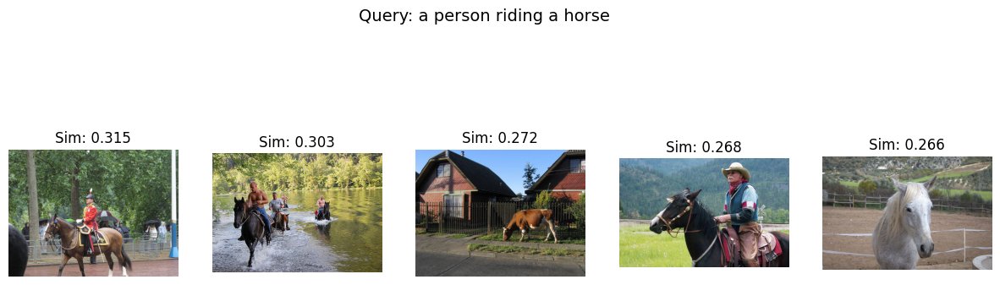

In [19]:
retrieve_images("a person riding a horse")

# **Part 3: Stable Diffusion (20%)**

In [2]:
!pip install diffusers transformers accelerate torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 33.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 37.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [1]:
from diffusers import StableDiffusionImg2ImgPipeline
import torch
from PIL import Image
import requests
import matplotlib.pyplot as plt

pipe = StableDiffusionImg2ImgPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipe.to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionImg2ImgPipeline {
  "_class_name": "StableDiffusionImg2ImgPipeline",
  "_diffusers_version": "0.32.2",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [2]:
image_path = "/content/images.jpg"
input_image = Image.open(image_path).convert("RGB")
input_image = input_image.resize((512, 512))

In [7]:
prompts = [
    "watercolor painting",
    "a pixel art",
    "in the style of Salvador Dalí",
    "in the style of Van Gogh"
]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

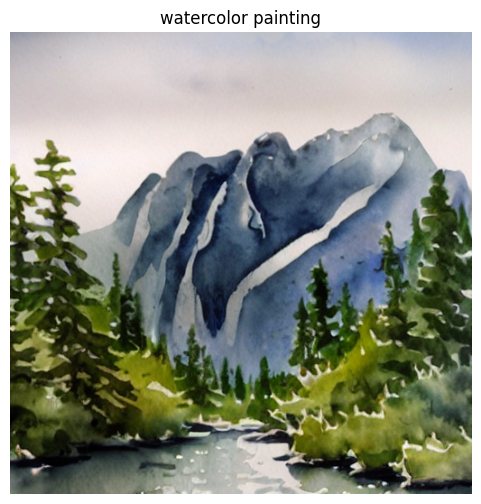

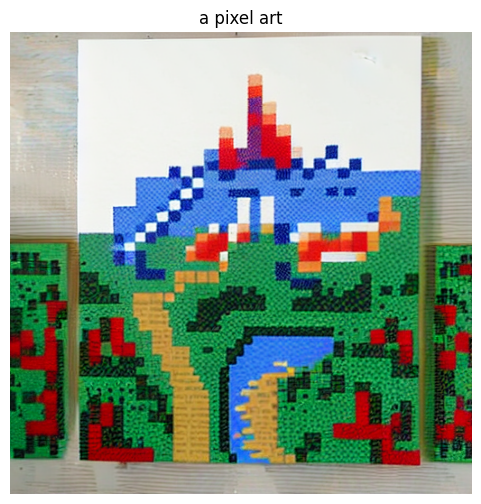

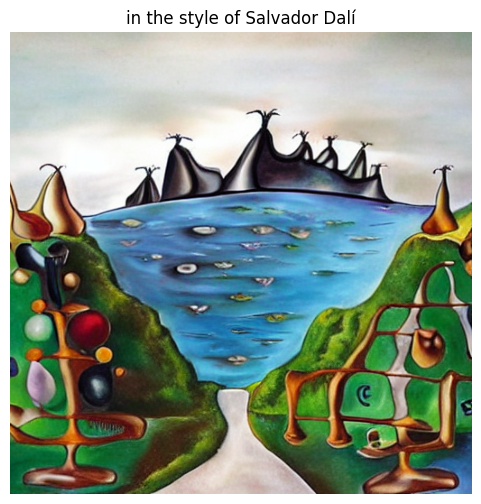

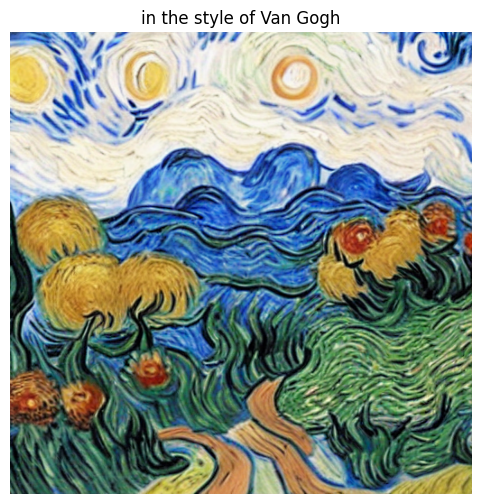

In [3]:
strength = 0.75
guidance_scale = 7.5

images = []
for prompt in prompts:
    with torch.no_grad():
        output = pipe(prompt=prompt, image=input_image, strength=strength, guidance_scale=guidance_scale)
        images.append((prompt, output.images[0]))

for prompt, img in images:
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(prompt)
    plt.show()

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

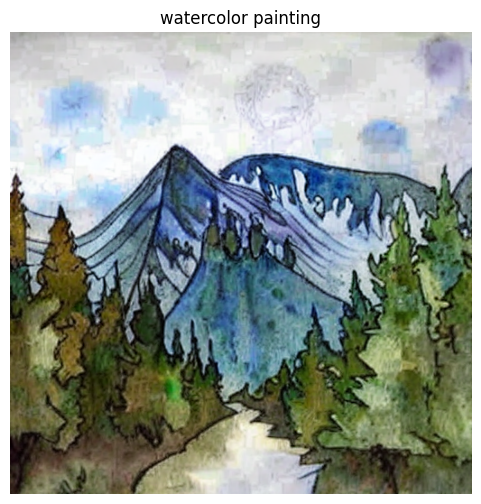

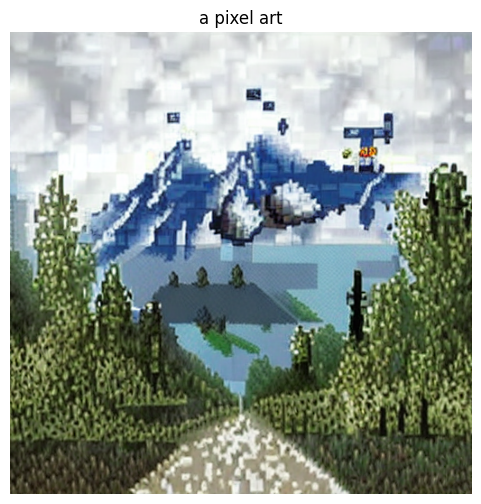

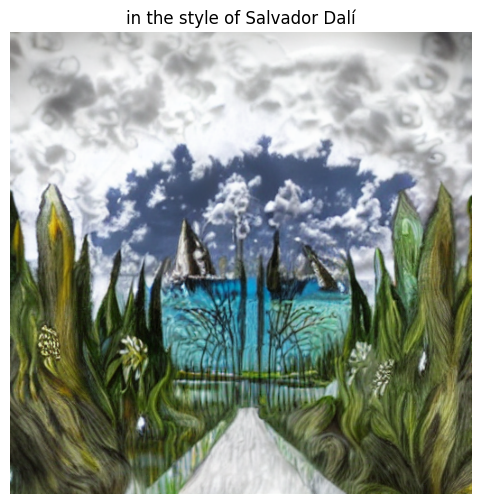

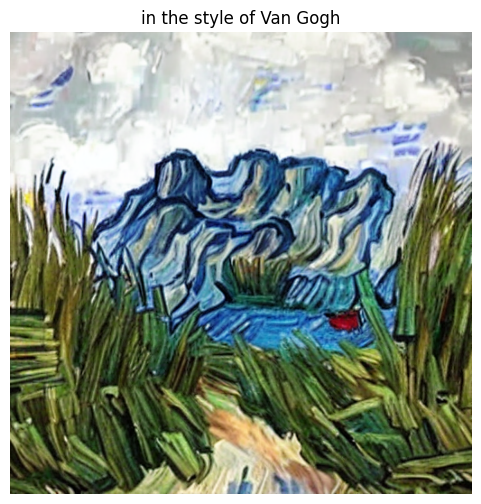

In [4]:
strength = 0.5
guidance_scale = 10

images = []
for prompt in prompts:
    with torch.no_grad():
        output = pipe(prompt=prompt, image=input_image, strength=strength, guidance_scale=guidance_scale)
        images.append((prompt, output.images[0]))

for prompt, img in images:
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(prompt)
    plt.show()

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

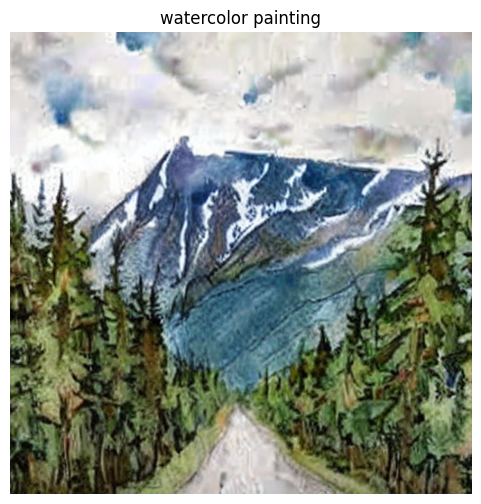

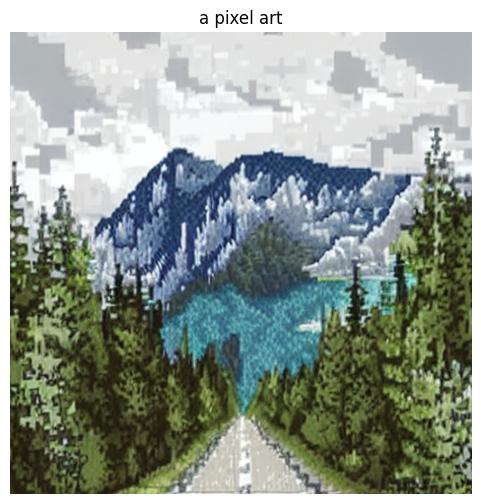

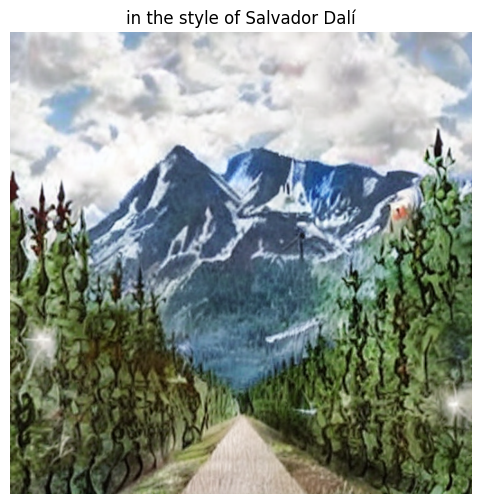

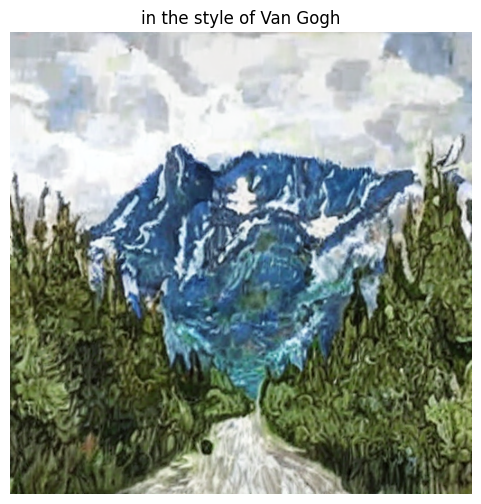

In [6]:
strength = 0.4
guidance_scale = 5

images = []
for prompt in prompts:
    with torch.no_grad():
        output = pipe(prompt=prompt, image=input_image, strength=strength, guidance_scale=guidance_scale)
        images.append((prompt, output.images[0]))

for prompt, img in images:
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(prompt)
    plt.show()

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

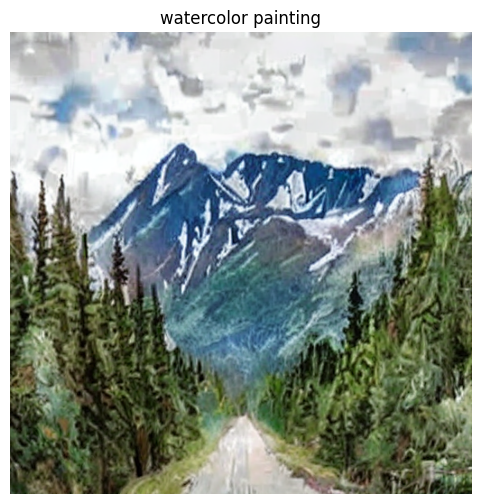

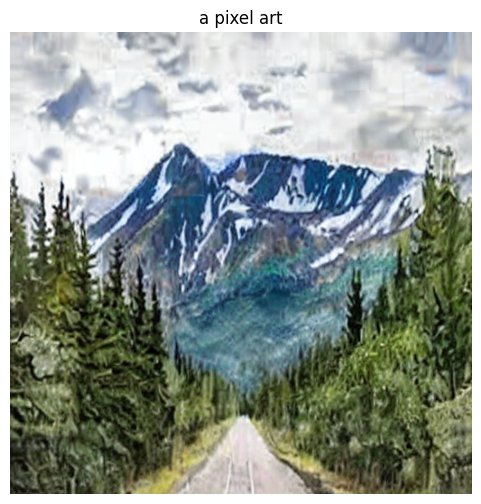

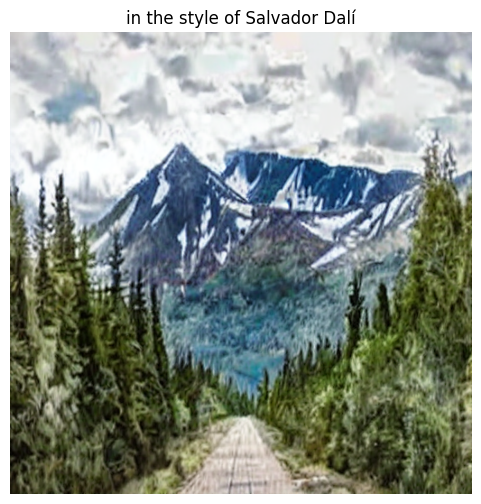

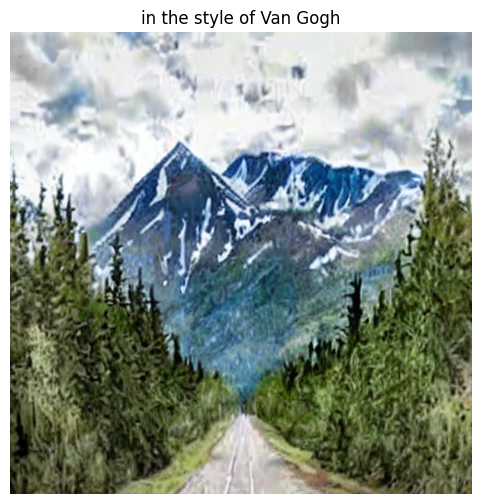

In [8]:
strength = 0.25
guidance_scale = 3

images = []
for prompt in prompts:
    with torch.no_grad():
        output = pipe(prompt=prompt, image=input_image, strength=strength, guidance_scale=guidance_scale)
        images.append((prompt, output.images[0]))

for prompt, img in images:
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(prompt)
    plt.show()